<a href="https://colab.research.google.com/github/Kzis/DL/blob/master/data_augmention_full.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%tensorflow_version 2.x

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib.pyplot import imread, imshow, subplots, show , imsave
import glob

In [0]:
def read_img(img):
    full_path = img.split("/")
    path = full_path[0]
    full_filename = full_path[1].split(".")
    filename = full_filename[0]
    file_extension = full_filename[1]
    image = imread(img)
    images = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    return images,path,filename,file_extension

In [0]:
# Importing Image module from PIL package  
from PIL import Image  
import PIL  

def save_img(path,filename,format,image):
  # imsave(path+'/'+filename+'.'+format, image)
  print("Save image : " , path+'/'+filename+'.'+format)
  im = Image.fromarray(image)
  im.save(path+'/'+filename+'.'+format)

In [0]:
# path = "mama_out"
def plot(images,data_generator,generator_type):
    imag,path,filename,file_extension = images
   
    data_generator.fit(imag)
    image_iterator = data_generator.flow(imag , save_to_dir="mama_out" ,save_prefix='aug', save_format=file_extension)
    # print(image_iterator.next())

    fig, rows = subplots(nrows=1, ncols=4, figsize=(18,18))
    for idx , row in enumerate(rows, start=1):
        # save_img(path,images[2]+"_"+generator_type+"_"+ str(idx),images[3],image_iterator.next()[0].astype('int'))
        row.imshow(image_iterator.next()[0].astype('int'))
        row.axis('off')
    show()

In [0]:
# 1. Rotation
def rotation(images):
  data_generator = ImageDataGenerator(rotation_range=90)
  plot(images,data_generator,"rotation")

In [0]:
# 2. Width Shifting
def width_shifting(images):
  data_generator = ImageDataGenerator(width_shift_range=0.3)
  plot(images,data_generator,"width_shifting")

In [0]:
# 3. Height Shifting
def height_shifting(images):
  data_generator = ImageDataGenerator(height_shift_range=0.3)
  plot(images,data_generator,"height_shifting")

In [0]:
# 4. Brightness
def brightness(images):
  data_generator = ImageDataGenerator(brightness_range=(0.1, 0.9))
  plot(images,data_generator,"brightness")

In [0]:
# 5. Shear Intensity
def shear_intensity(images):
  data_generator = ImageDataGenerator(shear_range=45.0)
  plot(images,data_generator,"shear_intensity")

In [0]:
# 6. Zoom
def zoom(images):
  data_generator = ImageDataGenerator(zoom_range=[0.5, 1.5])
  plot(images,data_generator,"zoom")

In [0]:
# 7. Channel Shift
def channel_shift(images):
  data_generator = ImageDataGenerator(channel_shift_range=150.0)
  plot(images,data_generator,"channel_shift")

In [0]:
# 8. Horizontal Flip
def horizontal_flip(images):
  data_generator = ImageDataGenerator(horizontal_flip=True)
  plot(images,data_generator,"horizontal_flip")

In [0]:
# 9. Vertical Flip
def vertical_flip(images):
  data_generator = ImageDataGenerator(vertical_flip=True)
  plot(images,data_generator,"vertical_flip")

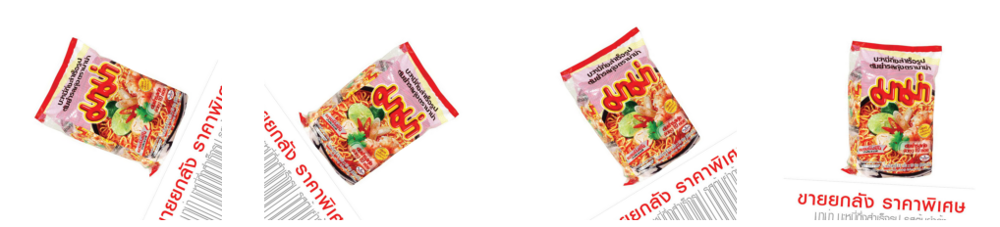

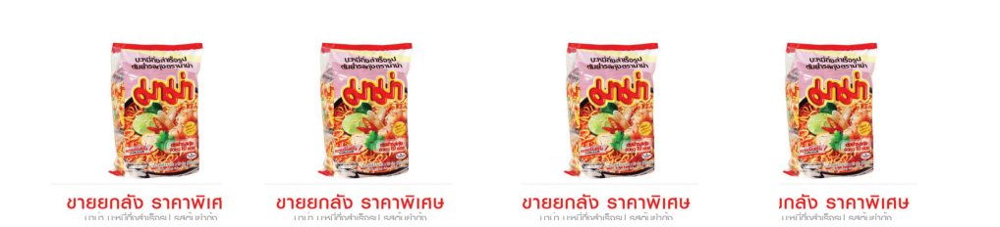

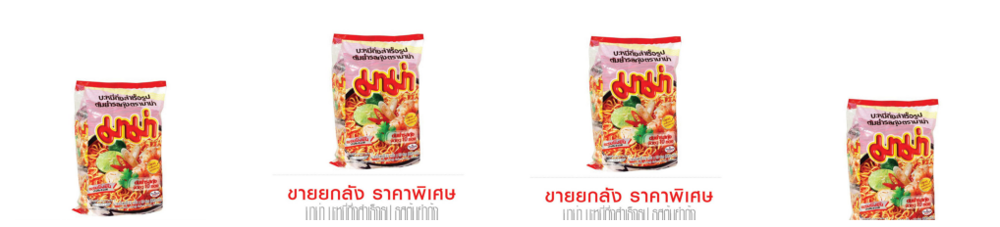

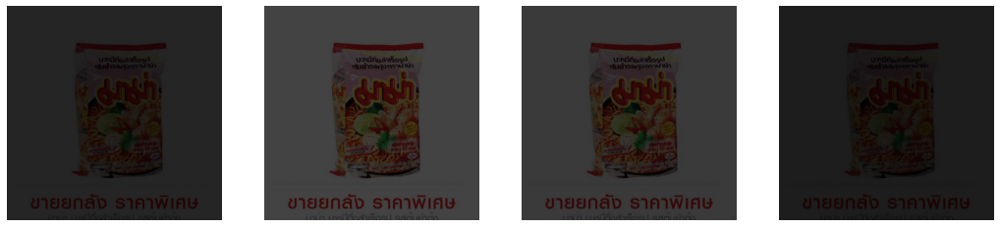

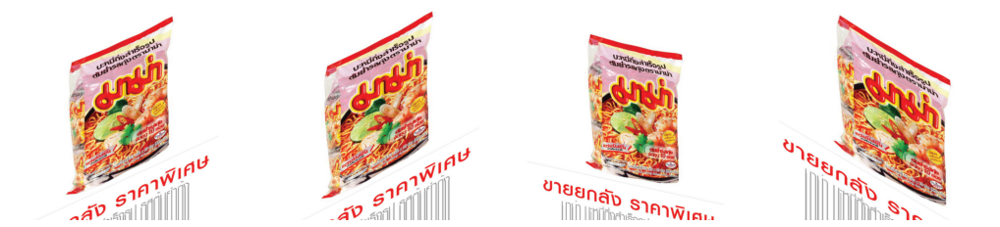

...

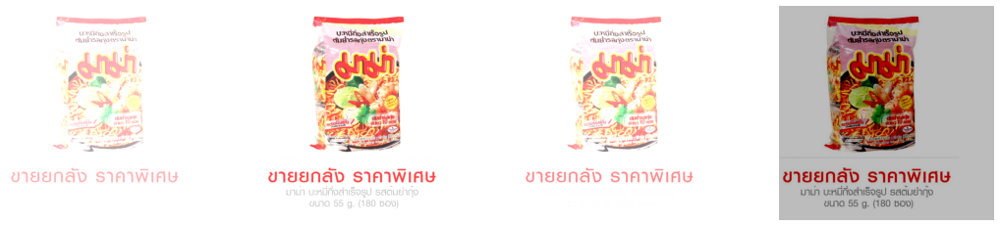

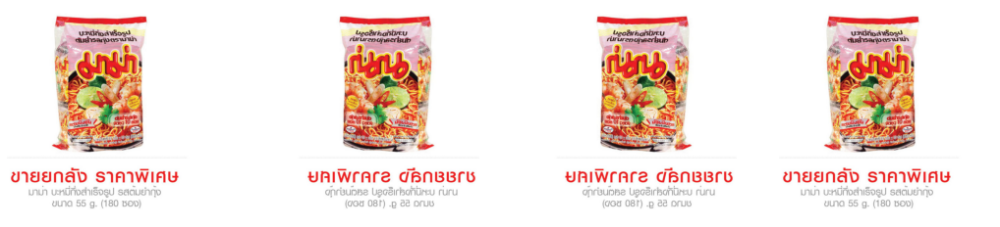

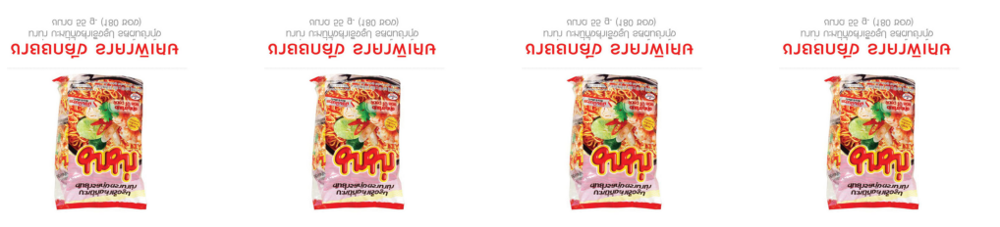

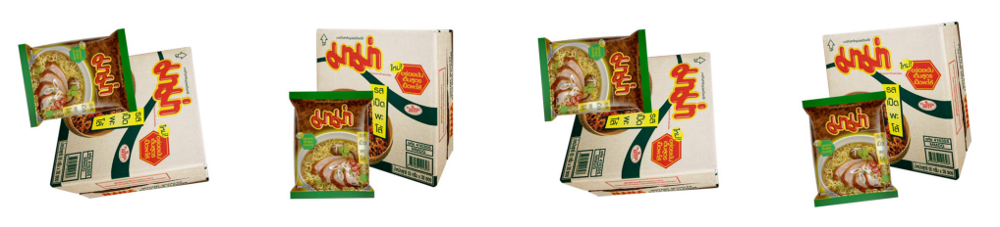

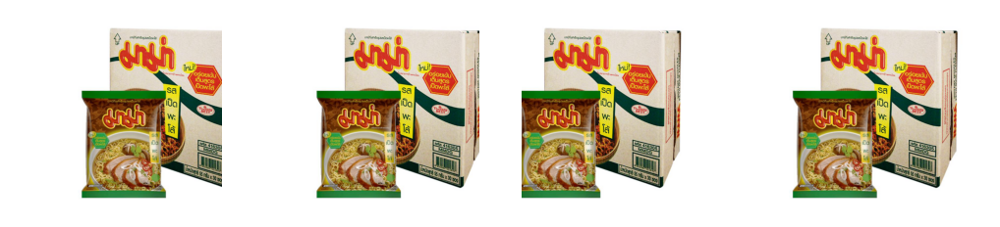

In [0]:
# Read image all directory
for img in glob.glob("mama_in/*.jpg"):
    images = read_img(img)
    rotation(images)
    width_shifting(images)
    height_shifting(images)
    brightness(images)
    shear_intensity(images)
    zoom(images)
    channel_shift(images)
    horizontal_flip(images)
    vertical_flip(images)
